In [19]:
import anndata as ad
from scvi.model import SCVI

from plotnine import *
from theme_nxn import theme_nxn, get_nxn_palette

In [3]:
adata = ad.read_h5ad('adata_with_null.h5ad')

In [4]:
model = SCVI.load('scvi_results/scvi_model', adata = adata)

INFO     File scvi_results/scvi_model/model.pt already downloaded                                                  


/Users/val/miniforge3/lib/python3.12/site-packages/scvi/model/base/_base_model.py:694: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator=='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


In [12]:
adata.var

,mmusculus_gene,hsapiens_gene,ortholog,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,ignore
Xkr4,Xkr4,XKR4,XKR4,8110,0.257233,0.228913,93.296191,31119.0,10.345606,False,0.616821,4.540978,1.862994,4,False,False
LOC118567655,LOC118567655,LOC118567655,LOC118567655,1342,0.014953,0.014843,98.890689,1809.0,7.501082,False,0.041460,2.736907,-0.346307,0,False,True
Rp1,Rp1,RP1,RP1,2230,0.144318,0.134809,98.156659,17459.0,9.767668,True,0.039248,6.455976,2.731505,7,False,False
Sox17,Sox17,SOX17,SOX17,11826,0.414512,0.346785,90.224507,50146.0,10.822714,True,0.555509,5.200490,6.362012,10,True,False
Gm22307,Gm22307,Gm22307,Gm22307,50,0.000413,0.000413,99.958669,50.0,3.931826,False,0.000000,0.000000,0.000000,0,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TrnL2,TrnL2,TrnL2,TrnL2,179,0.001488,0.001487,99.852037,180.0,5.198497,False,0.000000,0.000000,0.000000,0,False,True
TrnT,TrnT,TrnT,TrnT,1712,0.014929,0.014818,98.584843,1806.0,7.499424,False,0.011636,0.902034,-0.198663,0,False,True
TrnP,TrnP,TrnP,TrnP,634,0.005290,0.005276,99.475929,640.0,6.463029,False,0.000000,0.000000,0.000000,0,False,True
EFYP,EFYP,EFYP,EFYP,2118,0.018632,0.018460,98.249240,2254.0,7.720905,False,0.056360,3.971263,-0.032339,0,False,False


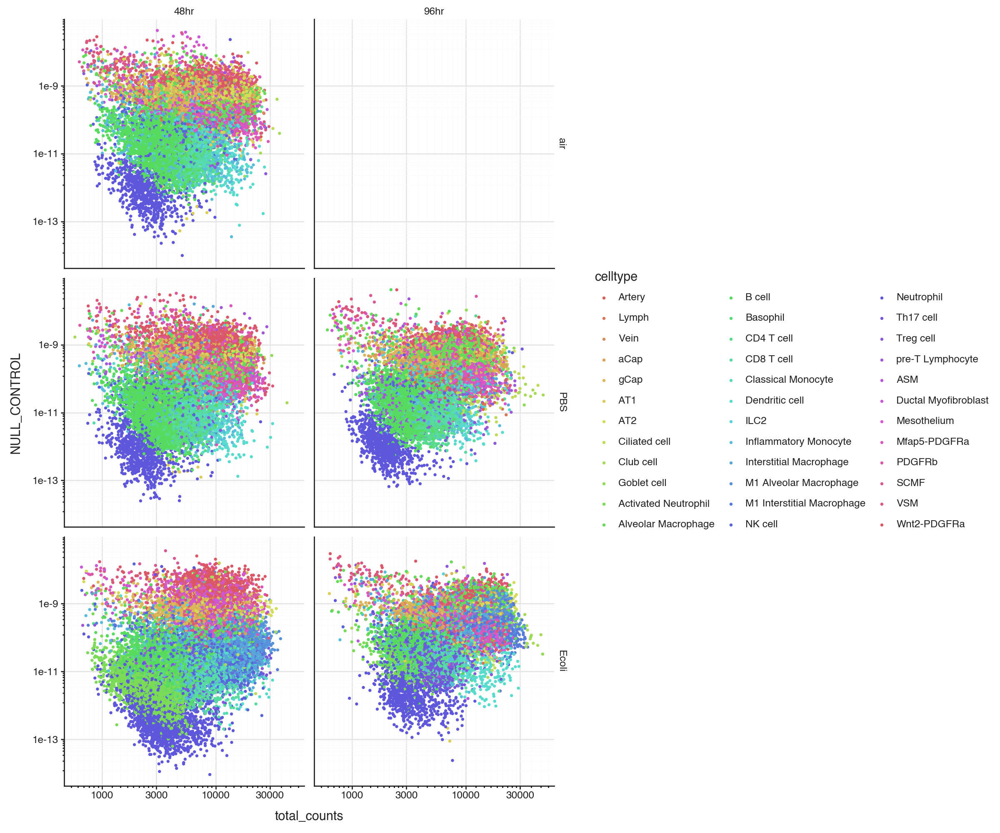

In [65]:
g1_ = 'NULL_CONTROL'
g2_ = 'Ifng'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

(
    ggplot(adata.obs, aes(x="total_counts", y="g1_", color="celltype"))
    + geom_point(size=0.5)
    + scale_x_log10()
    + scale_y_log10()
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(figure_size=(12, 10))
    + labs(y=g1_)
)


In [66]:
model.adata.obs.head().T

CellID,AAACCCACAATTGCAC,AAACCCAGTCGTCAGC,AAACCCATCCTGGGAC,AAACGAAAGGTCCAGA,AAACGAAAGTAGGAAG
batch,NAIR_S1,NAIR_S1,NAIR_S1,NAIR_S1,NAIR_S1
age,neonatal,neonatal,neonatal,neonatal,neonatal
species,mmusculus,mmusculus,mmusculus,mmusculus,mmusculus
condition,unaffected,unaffected,unaffected,unaffected,unaffected
treatment,air,air,air,air,air
time_post_treatment,48hr,48hr,48hr,48hr,48hr
sample,0,0,0,0,0
n_genes_by_counts,1767,3235,4054,2723,1307
log1p_n_genes_by_counts,7.477604,8.082093,8.307706,7.909857,7.176255
total_counts,3731.0,7630.0,11886.0,6410.0,2798.0


In [67]:
from scipy import sparse
import numpy as np

X = model.adata.X
if sparse.issparse(X):
    nonzero_per_row = X.getnnz(axis=1)
else:
    nonzero_per_row = np.asarray((X != 0).sum(axis=1)).ravel()

model.adata.obs['n_genes_detected'] = nonzero_per_row
model.adata.obs['n_genes_detected'].describe()

count    90883.000000
mean      3135.452769
std       1423.409772
min          9.000000
25%       2021.500000
50%       3030.000000
75%       4145.000000
max       7686.000000
Name: n_genes_detected, dtype: float64

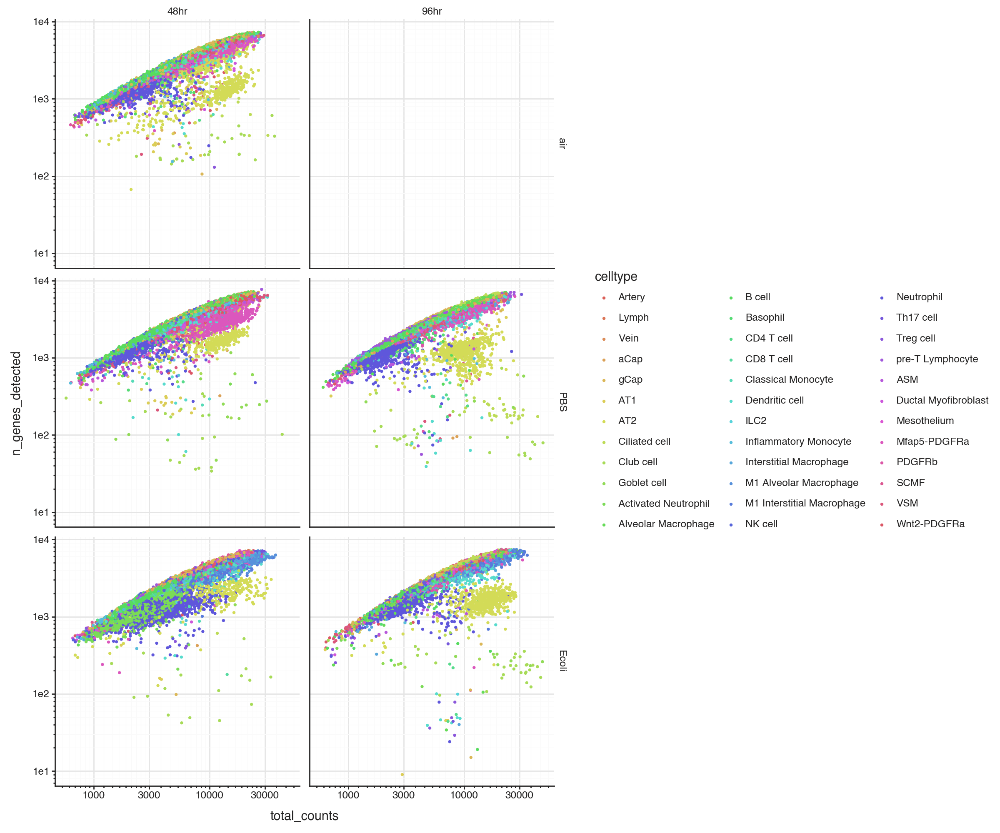

In [69]:
(
    ggplot(adata.obs, aes(x="total_counts", y="n_genes_detected", color="celltype"))
    + geom_point(size=0.5)
    + scale_x_log10()
    + scale_y_log10()
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(figure_size=(12, 10))
)


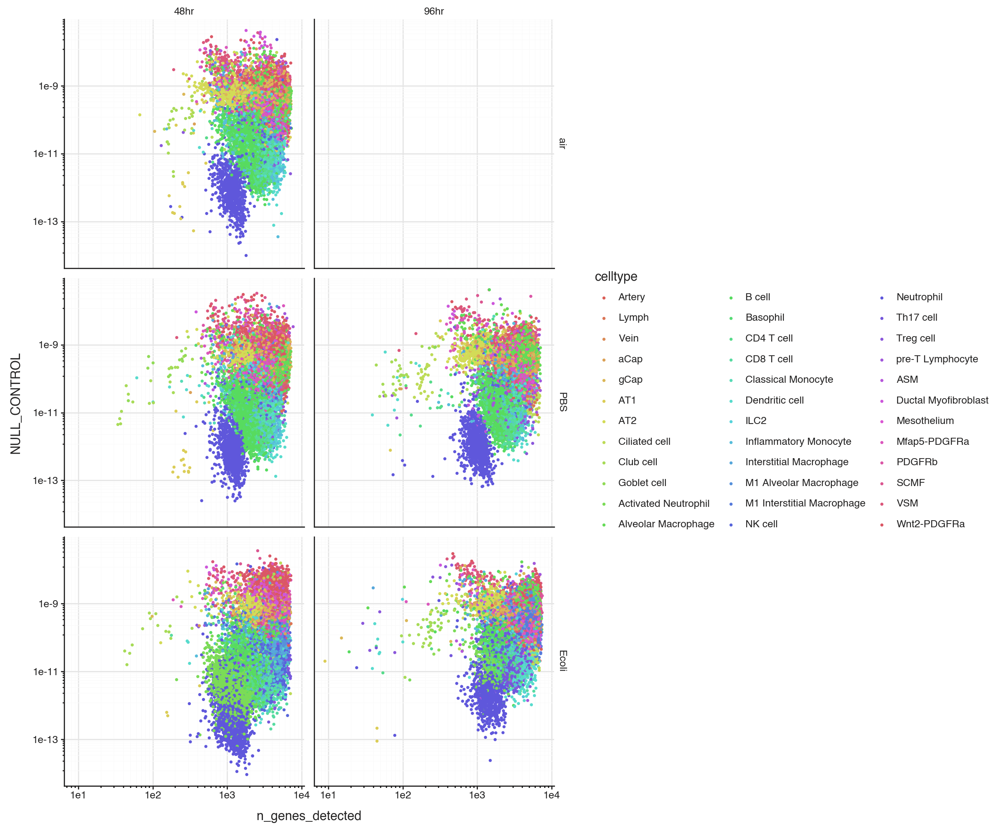

In [68]:
(
    ggplot(adata.obs, aes(x="n_genes_detected", y="g1_", color="celltype"))
    + geom_point(size=0.5)
    + scale_x_log10()
    + scale_y_log10()
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(figure_size=(12, 10))
    + labs(y=g1_)
)


In [8]:
adata.var.loc['Tbx21']

mmusculus_gene                      Tbx21
hsapiens_gene                       TBX21
ortholog                            TBX21
n_cells_by_counts                    4557
mean_counts                      0.104955
log1p_mean_counts                0.099804
pct_dropout_by_counts           96.233137
total_counts                      12697.0
log1p_total_counts                 9.4492
highly_variable                      True
means                            0.308073
dispersions                      5.192063
dispersions_norm                  2.80805
highly_variable_nbatches                8
highly_variable_intersection        False
ignore                              False
Name: Tbx21, dtype: object

In [74]:
gexp = model.get_normalized_expression(gene_list = ['Cd3e', 'Cd4'], batch_size = 512)
gexp

,Cd4,Cd3e
CellID,,
AAACCCACAATTGCAC,1.147200e-07,5.216461e-07
AAACCCAGTCGTCAGC,1.692506e-07,2.371514e-07
AAACCCATCCTGGGAC,8.342145e-08,3.799779e-07
AAACGAAAGGTCCAGA,1.520037e-07,9.827285e-07
AAACGAAAGTAGGAAG,1.603879e-04,5.558555e-04
...,...,...
TTTGTTGCAATGCAAA,4.594609e-04,5.398709e-04
TTTGTTGCATCGGAAG,1.474296e-06,1.823056e-06
TTTGTTGGTGGCATCC,5.355173e-04,5.649018e-04


In [16]:
gexp.sum()

Tbx21           1.556882
NULL_CONTROL    0.000041
dtype: float32

In [52]:
g1_ = 'Cd3e'
g2_ = 'Cd4'

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

In [53]:
model.adata.obs.head().T

CellID,AAACCCACAATTGCAC,AAACCCAGTCGTCAGC,AAACCCATCCTGGGAC,AAACGAAAGGTCCAGA,AAACGAAAGTAGGAAG
batch,NAIR_S1,NAIR_S1,NAIR_S1,NAIR_S1,NAIR_S1
age,neonatal,neonatal,neonatal,neonatal,neonatal
species,mmusculus,mmusculus,mmusculus,mmusculus,mmusculus
condition,unaffected,unaffected,unaffected,unaffected,unaffected
treatment,air,air,air,air,air
time_post_treatment,48hr,48hr,48hr,48hr,48hr
sample,0,0,0,0,0
n_genes_by_counts,1767,3235,4054,2723,1307
log1p_n_genes_by_counts,7.477604,8.082093,8.307706,7.909857,7.176255
total_counts,3731.0,7630.0,11886.0,6410.0,2798.0


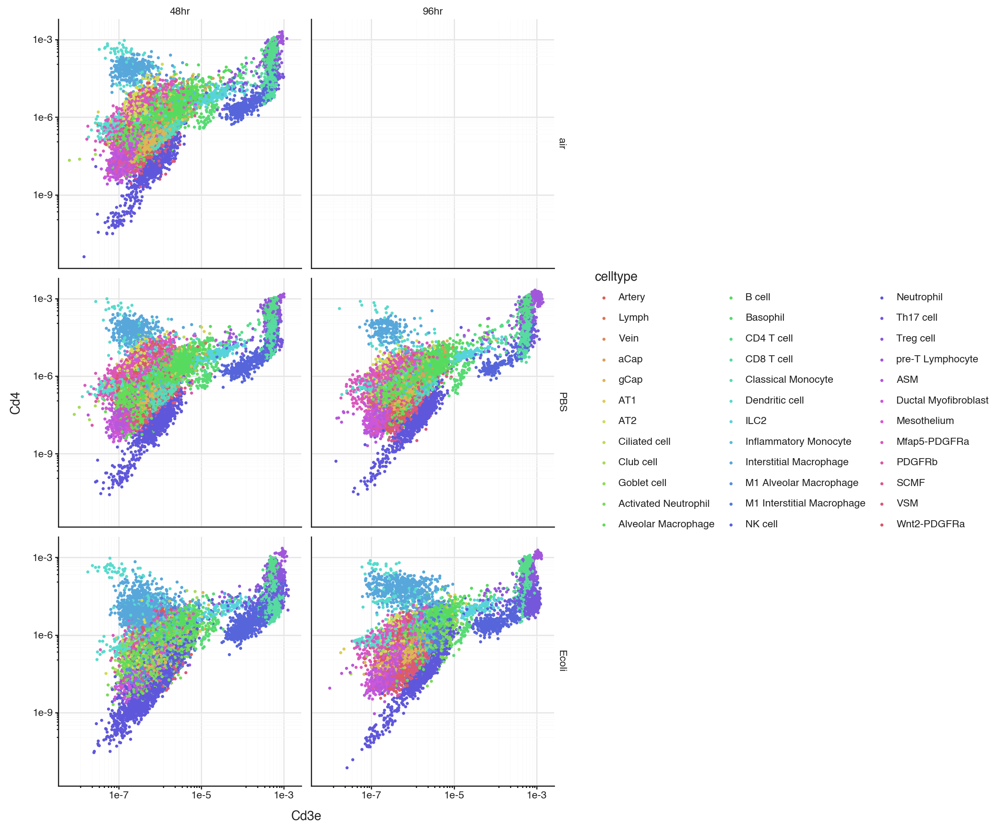

In [56]:
(
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="celltype"))
    + geom_point(size=0.5)
    + scale_x_log10()
    + scale_y_log10()
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(figure_size=(12, 10))
    + labs(x=g1_, y=g2_)
)


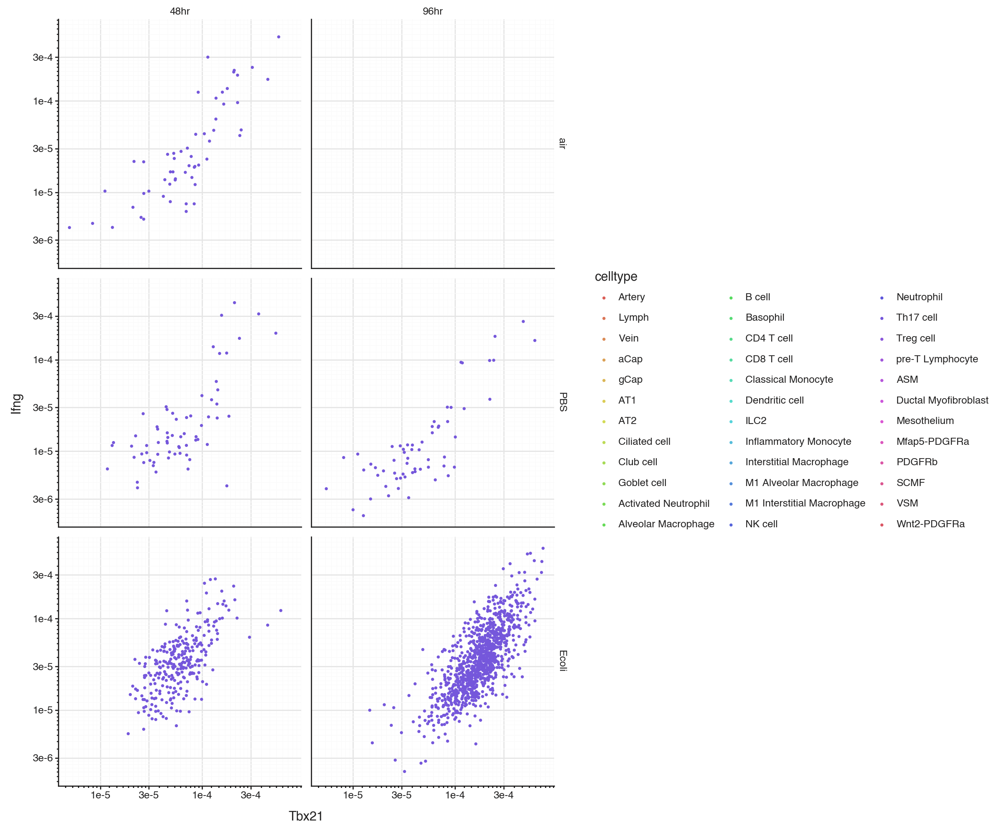

In [63]:
g1_ = 'Tbx21'
g2_ = 'Ifng'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

(
    ggplot(adata.obs.query('celltype == "Th17 cell"'), aes(x="g1_", y="g2_", color="celltype"))
    + geom_point(size=0.5)
    + scale_x_log10()
    + scale_y_log10()
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(figure_size=(12, 10))
    + labs(x=g1_, y=g2_)
)


In [78]:
cd3_vars = adata.var[adata.var['mmusculus_gene'].str.startswith('Cd3', na=False)]
cd3_vars

,mmusculus_gene,hsapiens_gene,ortholog,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,ignore
Cd34,Cd34,CD34,CD34,28858,1.290562,0.828797,76.145682,156127.0,11.958431,True,1.441110,4.525573,5.506334,10,True,False
Cd302,Cd302,CD302,CD302,40529,0.987898,0.687078,66.498314,119512.0,11.691180,True,1.973271,3.470251,1.880581,5,False,False
Cd36,Cd36,CD36,CD36,41502,3.550787,1.515300,65.694022,429560.0,12.970519,True,2.288725,4.312252,6.659391,10,True,False
Cd38,Cd38,CD38,CD38,22223,0.483261,0.394243,81.630241,58463.0,10.976167,True,1.314945,4.113781,3.228882,9,False,False
Cd3eap,Cd3eap,POLR1G,POLR1G,12262,0.126066,0.118730,89.864105,15251.0,9.632466,False,0.532517,4.218152,-0.911566,0,False,False
Cd33,Cd33,CD33,CD33,12048,0.146748,0.136930,90.041000,17753.0,9.784366,False,0.730530,4.375341,1.430276,3,False,False
Cd37,Cd37,CD37,CD37,40872,0.914702,0.649562,66.214786,110657.0,11.614200,True,2.350710,3.574243,4.128850,8,False,False
Cd3g,Cd3g,CD3G,CD3G,14063,0.498677,0.404583,88.375380,60328.0,11.007568,True,0.852606,5.434642,9.742952,10,True,False
Cd3d,Cd3d,CD3D,CD3D,13975,0.498801,0.404666,88.448122,60343.0,11.007817,True,0.827879,5.569456,10.619000,10,True,False
Cd3e,Cd3e,CD3E,CD3E,12112,0.321626,0.278863,89.988097,38909.0,10.569007,True,0.745453,5.311691,8.468067,10,True,False


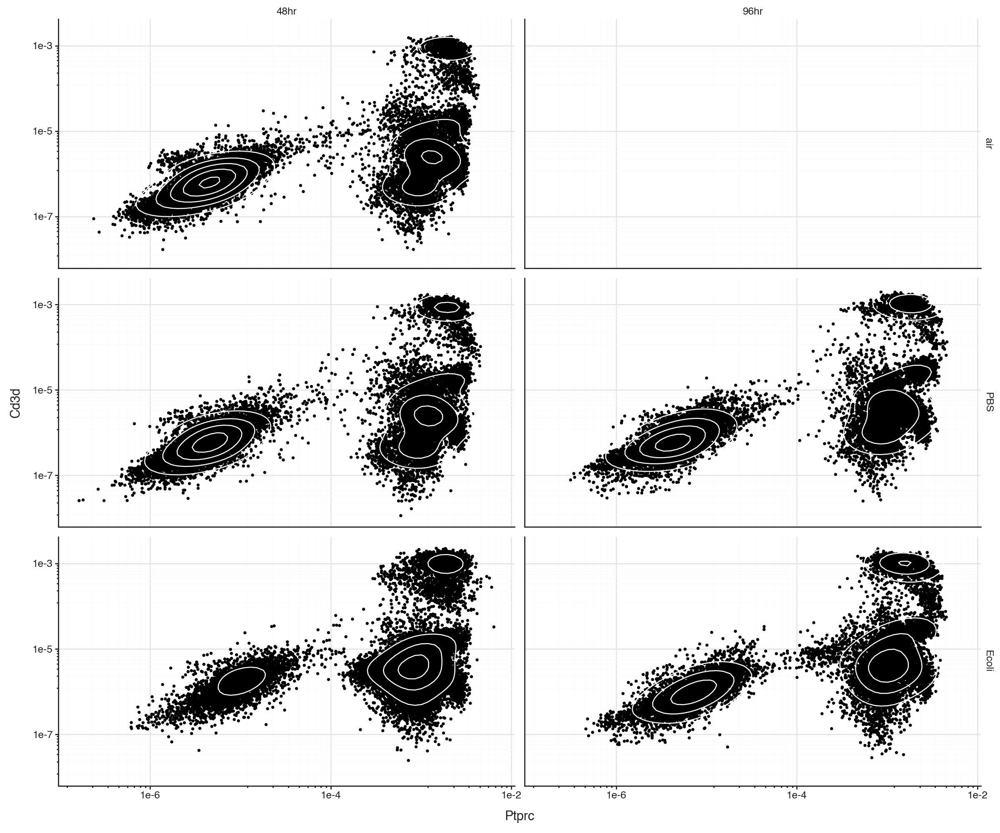

In [82]:
g1_ = 'Ptprc'
g2_ = 'Cd3d'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

(
    ggplot(adata.obs, aes(x="g1_", y="g2_"))
    + geom_point(size=0.5)
    + geom_density_2d(color="white")
    + scale_x_log10()
    + scale_y_log10()
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(figure_size=(12, 10))
    + labs(x=g1_, y=g2_)
)


/Users/val/miniforge3/lib/python3.12/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 8 x 12 in image.
/Users/val/miniforge3/lib/python3.12/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: Figures/Figure1.png


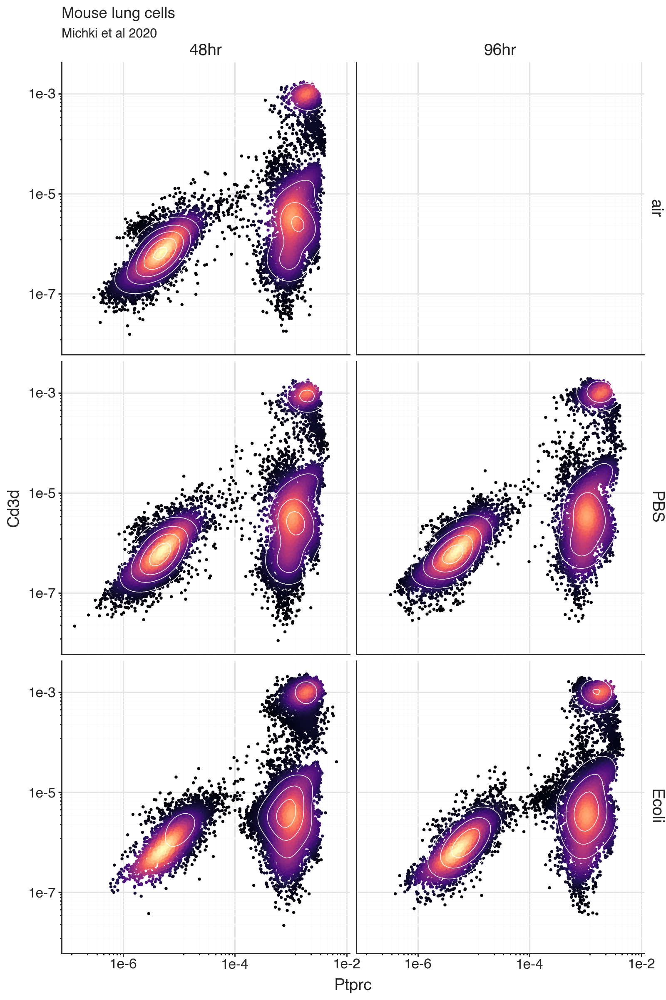

In [107]:
from scipy.stats import gaussian_kde
import numpy as np

g1_ = 'Ptprc'
g2_ = 'Cd3d'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

# compute local density in log-space (matches log10 axes)
eps = 1e-8
x = np.log10(adata.obs['g1_'].values + eps)
y = np.log10(adata.obs['g2_'].values + eps)
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

adata.obs['density'] = z

p_ = (
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="density"))
    + geom_point(size=0.5, show_legend=False)
    + geom_density_2d(color="white", size=0.3)
    + scale_x_log10()
    + scale_y_log10()
    + scale_color_cmap("magma")
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(
        figure_size=(8, 12),
        axis_text=element_text(size=12),        # axis tick labels
        axis_title=element_text(size=14),       # axis titles
        strip_text=element_text(size=14)        # facet (strip) labels
    )
    + labs(x=g1_, y=g2_, title="Mouse lung cells", subtitle="Michki et al 2020")
)

p_.save('Figures/Figure1.png', dpi=300)

p_

/Users/val/miniforge3/lib/python3.12/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 8 x 12 in image.
/Users/val/miniforge3/lib/python3.12/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: Figures/Figure2.png


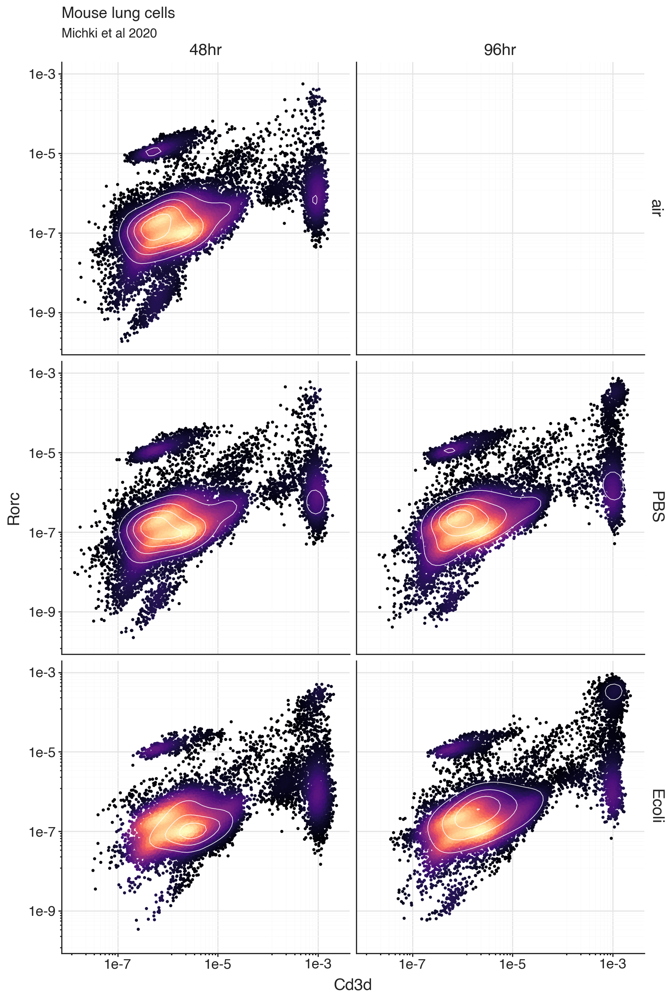

In [108]:
from scipy.stats import gaussian_kde
import numpy as np

g1_ = 'Cd3d'
g2_ = 'Rorc'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

# compute local density in log-space (matches log10 axes)
eps = 1e-8
x = np.log10(adata.obs['g1_'].values + eps)
y = np.log10(adata.obs['g2_'].values + eps)
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

adata.obs['density'] = z

p_ = (
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="density"))
    + geom_point(size=0.5, show_legend=False)
    + geom_density_2d(color="white", size=0.3)
    + scale_x_log10()
    + scale_y_log10()
    + scale_color_cmap("magma")
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(
        figure_size=(8, 12),
        axis_text=element_text(size=12),        # axis tick labels
        axis_title=element_text(size=14),       # axis titles
        strip_text=element_text(size=14)        # facet (strip) labels
    )
    + labs(x=g1_, y=g2_, title="Mouse lung cells", subtitle="Michki et al 2020")
)

p_.save('Figures/Figure2.png', dpi=300)

p_

/Users/val/miniforge3/lib/python3.12/site-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 8 x 12 in image.
/Users/val/miniforge3/lib/python3.12/site-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: Figures/Figure3.png


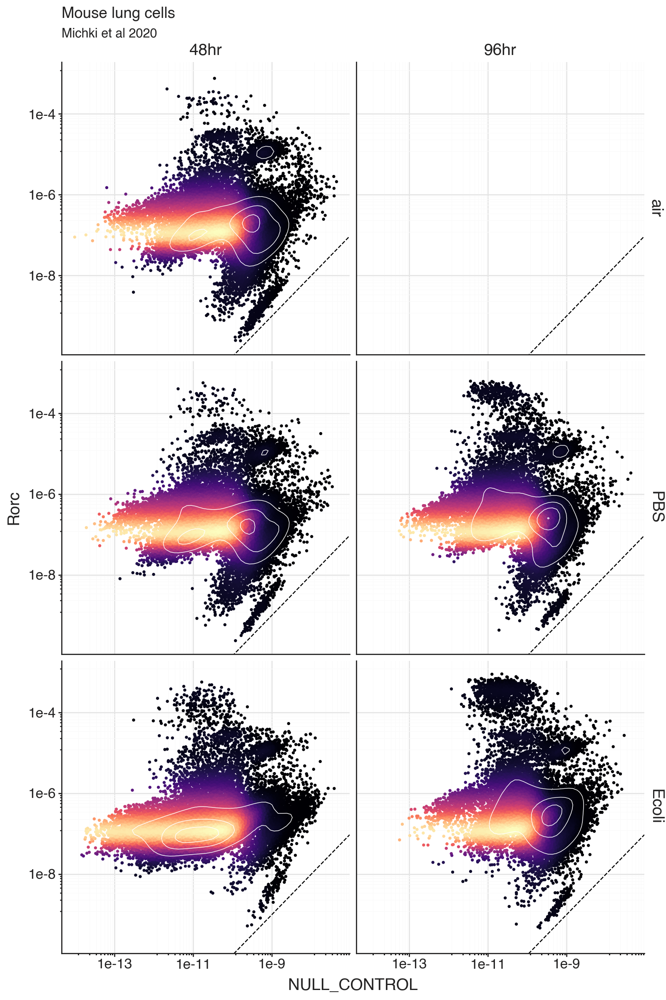

In [111]:
from scipy.stats import gaussian_kde
import numpy as np

g1_ = 'NULL_CONTROL'
g2_ = 'Rorc'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

# compute local density in log-space (matches log10 axes)
eps = 1e-8
x = np.log10(adata.obs['g1_'].values + eps)
y = np.log10(adata.obs['g2_'].values + eps)
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

adata.obs['density'] = z

p_ = (
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="density"))
    + geom_point(size=0.5, show_legend=False)
    + geom_abline(linetype="dashed")
    + geom_density_2d(color="white", size=0.3)
    + scale_x_log10()
    + scale_y_log10()
    + scale_color_cmap("magma")
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(
        figure_size=(8, 12),
        axis_text=element_text(size=12),        # axis tick labels
        axis_title=element_text(size=14),       # axis titles
        strip_text=element_text(size=14)        # facet (strip) labels
    )
    + labs(x=g1_, y=g2_, title="Mouse lung cells", subtitle="Michki et al 2020")
)

p_.save('Figures/Figure3.png', dpi=300)

p_

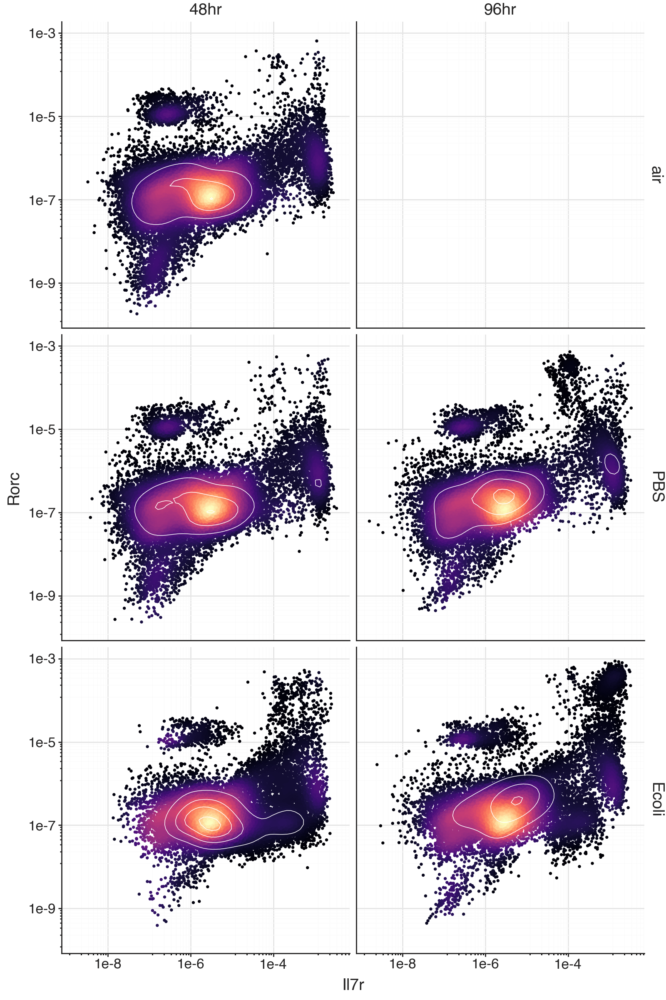

In [ ]:
from scipy.stats import gaussian_kde
import numpy as np

g1_ = 'Il7r'
g2_ = 'Rorc'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

# compute local density in log-space (matches log10 axes)
eps = 1e-8
x = np.log10(adata.obs['g1_'].values + eps)
y = np.log10(adata.obs['g2_'].values + eps)
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

adata.obs['density'] = z

(
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="density"))
    + geom_point(size=0.5, show_legend=False)
    + geom_density_2d(color="white", size=0.3)
    + scale_x_log10()
    + scale_y_log10()
    + scale_color_cmap("magma")
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(
        figure_size=(8, 12),
        axis_text=element_text(size=12),        # axis tick labels
        axis_title=element_text(size=14),       # axis titles
        strip_text=element_text(size=14)        # facet (strip) labels
    )
    + labs(x=g1_, y=g2_)
)


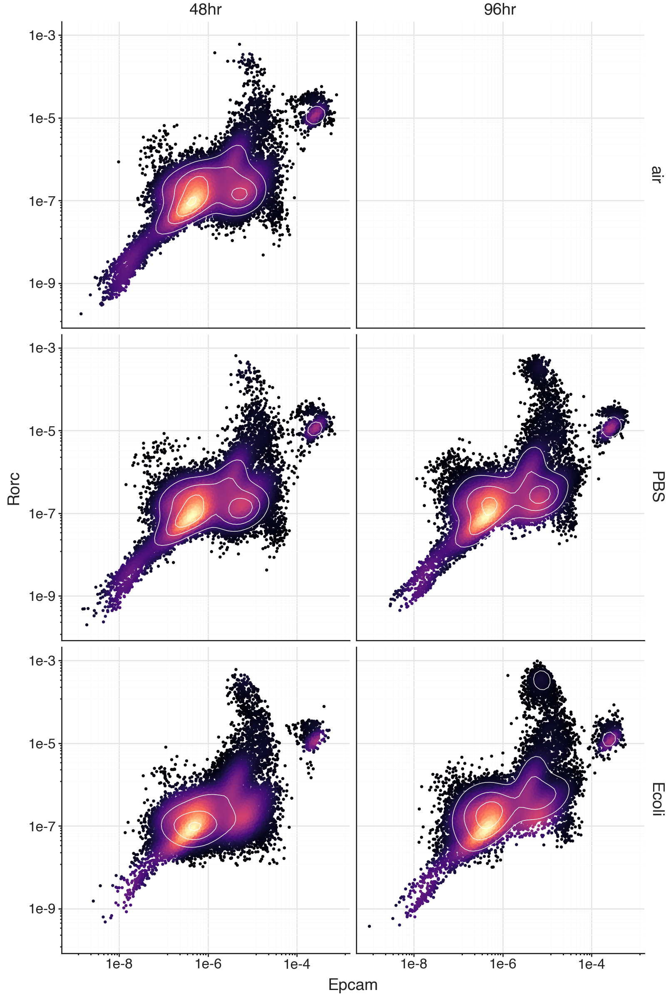

In [99]:
from scipy.stats import gaussian_kde
import numpy as np

g1_ = 'Epcam'
g2_ = 'Rorc'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

# compute local density in log-space (matches log10 axes)
eps = 1e-8
x = np.log10(adata.obs['g1_'].values + eps)
y = np.log10(adata.obs['g2_'].values + eps)
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

adata.obs['density'] = z

(
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="density"))
    + geom_point(size=0.5, show_legend=False)
    + geom_density_2d(color="white", size=0.3)
    + scale_x_log10()
    + scale_y_log10()
    + scale_color_cmap("magma")
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(
        figure_size=(8, 12),
        axis_text=element_text(size=12),        # axis tick labels
        axis_title=element_text(size=14),       # axis titles
        strip_text=element_text(size=14)        # facet (strip) labels
    )
    + labs(x=g1_, y=g2_)
)


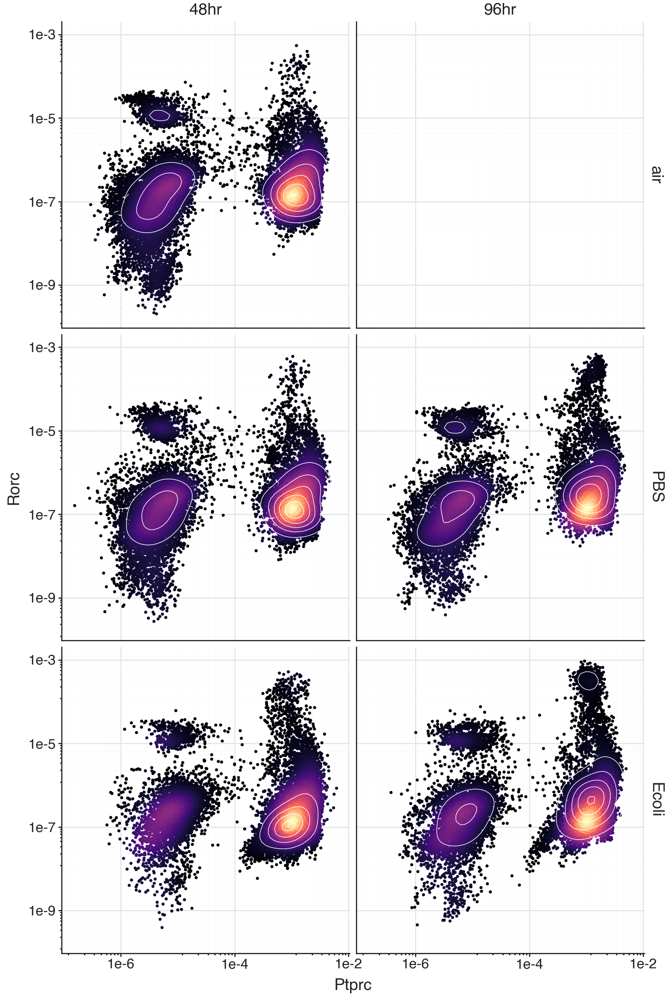

In [100]:
from scipy.stats import gaussian_kde
import numpy as np

g1_ = 'Ptprc'
g2_ = 'Rorc'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

# compute local density in log-space (matches log10 axes)
eps = 1e-8
x = np.log10(adata.obs['g1_'].values + eps)
y = np.log10(adata.obs['g2_'].values + eps)
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

adata.obs['density'] = z

(
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="density"))
    + geom_point(size=0.5, show_legend=False)
    + geom_density_2d(color="white", size=0.3)
    + scale_x_log10()
    + scale_y_log10()
    + scale_color_cmap("magma")
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(
        figure_size=(8, 12),
        axis_text=element_text(size=12),        # axis tick labels
        axis_title=element_text(size=14),       # axis titles
        strip_text=element_text(size=14)        # facet (strip) labels
    )
    + labs(x=g1_, y=g2_)
)


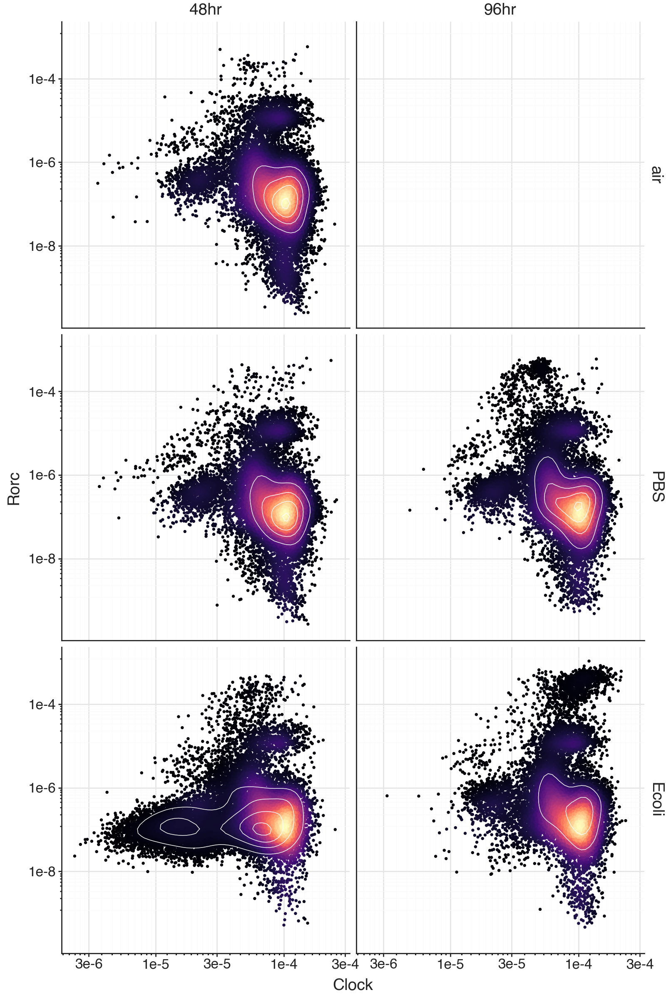

In [101]:
from scipy.stats import gaussian_kde
import numpy as np

g1_ = 'Clock'
g2_ = 'Rorc'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

# compute local density in log-space (matches log10 axes)
eps = 1e-8
x = np.log10(adata.obs['g1_'].values + eps)
y = np.log10(adata.obs['g2_'].values + eps)
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

adata.obs['density'] = z

(
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="density"))
    + geom_point(size=0.5, show_legend=False)
    + geom_density_2d(color="white", size=0.3)
    + scale_x_log10()
    + scale_y_log10()
    + scale_color_cmap("magma")
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(
        figure_size=(8, 12),
        axis_text=element_text(size=12),        # axis tick labels
        axis_title=element_text(size=14),       # axis titles
        strip_text=element_text(size=14)        # facet (strip) labels
    )
    + labs(x=g1_, y=g2_)
)


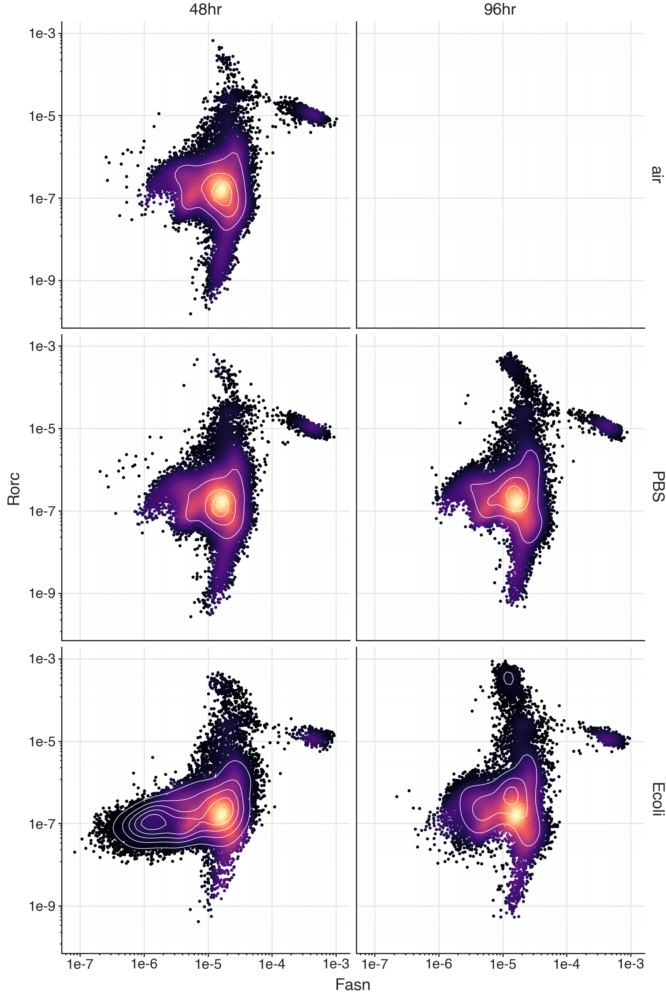

In [102]:
from scipy.stats import gaussian_kde
import numpy as np

g1_ = 'Fasn'
g2_ = 'Rorc'

gexp = model.get_normalized_expression(gene_list = [g1_, g2_])
gexp

model.adata.obs['g1_'] = gexp[g1_]
model.adata.obs['g2_'] = gexp[g2_]

# compute local density in log-space (matches log10 axes)
eps = 1e-8
x = np.log10(adata.obs['g1_'].values + eps)
y = np.log10(adata.obs['g2_'].values + eps)
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

adata.obs['density'] = z

(
    ggplot(adata.obs, aes(x="g1_", y="g2_", color="density"))
    + geom_point(size=0.5, show_legend=False)
    + geom_density_2d(color="white", size=0.3)
    + scale_x_log10()
    + scale_y_log10()
    + scale_color_cmap("magma")
    + facet_grid("treatment ~ time_post_treatment")
    + theme_nxn()
    + theme(
        figure_size=(8, 12),
        axis_text=element_text(size=12),        # axis tick labels
        axis_title=element_text(size=14),       # axis titles
        strip_text=element_text(size=14)        # facet (strip) labels
    )
    + labs(x=g1_, y=g2_)
)
